# Stackoverflow trends and stats in 2019

In [127]:
import sys
import setuptools as setup
import pandas as pd
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt

sys.version_info
setup.__file__

'/Users/zvonimirilic/Documents/sandbox/virtual-envs/so/lib/python3.7/site-packages/setuptools/__init__.py'

In [3]:
plt.style.use('ggplot')

## Number of questions and answers in 2019

In [4]:
data = pd.read_csv('./data/questions_and_answers.csv')
data

,questionCount,answerCount
0,2089876,2425454


Also __652419__ questions that were created in last year still have 0 answers :-(

## Most popular questions in 2019

In [5]:
pop_questions = pd.read_csv('./data/popular_questions.csv')
pop_questions['url'] = list(map(lambda x: f'https://stackoverflow.com/questions/{x}', pop_questions.Id))
pop_questions.head(10)

,Id,Title,Tags,Score,url
0,57456188,Why is the result of ('b'+'a'+ + 'a' + 'a').to...,<javascript><type-conversion>,568,https://stackoverflow.com/questions/57456188
1,54120862,Does the C++ standard allow for an uninitializ...,<c++><llvm><undefined-behavior><abi><llvm-code...,489,https://stackoverflow.com/questions/54120862
2,56435510,Presenting modal in iOS 13 fullscreen,<ios><viewcontroller><modalviewcontroller><ios13>,360,https://stackoverflow.com/questions/56435510
3,58657087,"After upgrading to Xcode 11.2 from Xcode 11.1,...",<ios><swift><xcode><uitextview><xcode11.2>,348,https://stackoverflow.com/questions/58657087
4,57842756,Why should I always enable compiler warnings?,<c++><c><warnings><compiler-warnings><c++-faq>,297,https://stackoverflow.com/questions/57842756
5,57650895,Why does glibc's strlen need to be so complica...,<c><optimization><glibc><portability><strlen>,286,https://stackoverflow.com/questions/57650895
6,55602748,What does Linus Torvalds mean when he says tha...,<git><version-control>,280,https://stackoverflow.com/questions/55602748
7,57259126,Why does the Rust compiler not optimize code a...,<rust><compiler-optimization><llvm-codegen>,276,https://stackoverflow.com/questions/57259126
8,56227419,Why does Python's hash of infinity have the di...,<python><math><hash><floating-point><pi>,240,https://stackoverflow.com/questions/56227419
9,56433665,What is the `some` keyword in Swift(UI)?,<swift><swift5.1>,235,https://stackoverflow.com/questions/56433665


## Daily activity in 2019 

In [6]:
daily_activity = pd.read_csv('./data/daily_activity.csv')

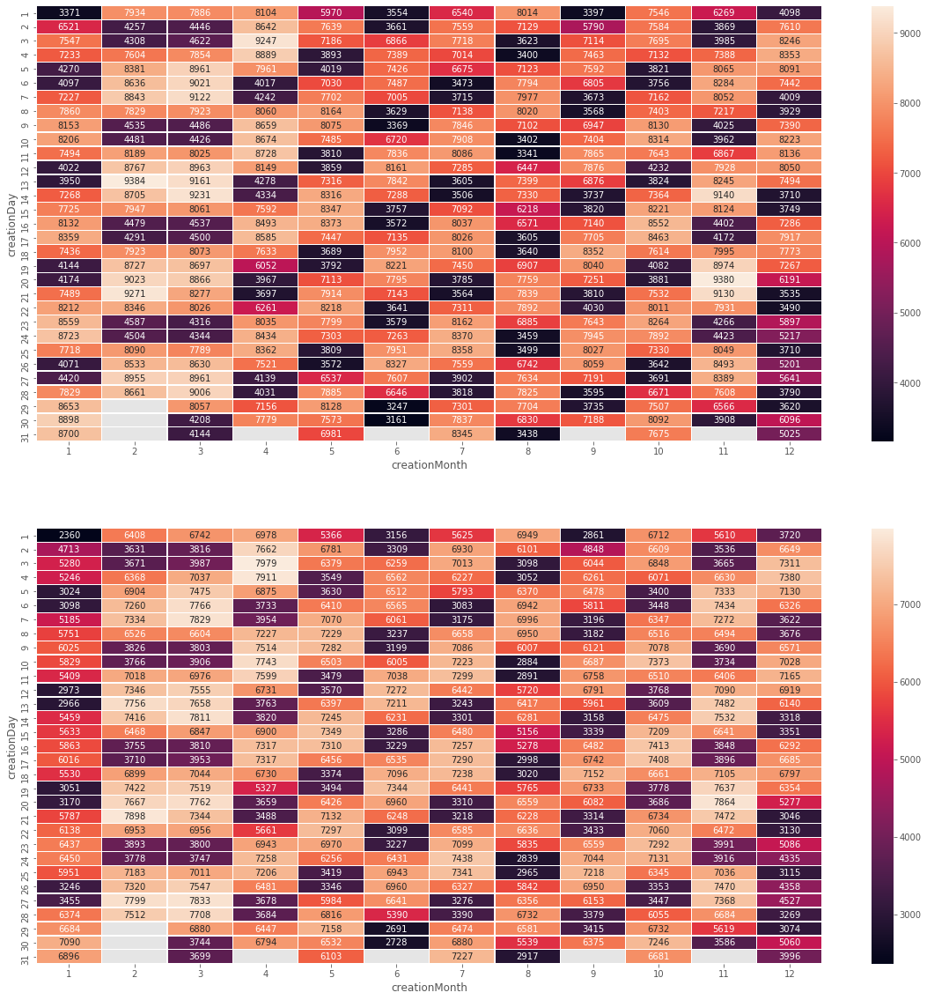

<Figure size 1080x720 with 0 Axes>

<Figure size 1080x720 with 0 Axes>

In [7]:
pivoted_questions = daily_activity[daily_activity.isAnswer == 0].pivot('creationDay', 'creationMonth', 'cnt')

fig = plt.figure(figsize=(20, 20))
ax1 = fig.add_subplot(2, 1, 1)
plt.figure(figsize=(15,10))
sns.heatmap(pivoted_questions, annot=True, fmt='.0f', linewidths=.25, ax=ax1)

pivoted_answers = daily_activity[daily_activity.isAnswer == 1].pivot('creationDay', 'creationMonth', 'cnt')
ax2 = fig.add_subplot(2, 1, 2)
plt.figure(figsize=(15,10))
sns.heatmap(pivoted_answers, annot=True, fmt='.0f', linewidths=.25, ax=ax2)

Let's see trends with line chart

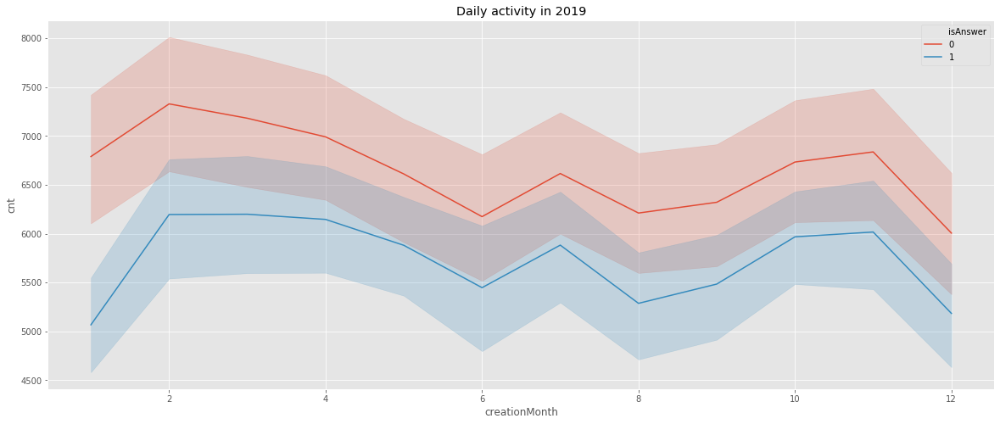

In [8]:
sorted_daily = daily_activity.sort_values(by=['creationMonth', 'creationDay'], ascending=[True, True])

plt.figure(figsize=(20, 8))
plt.title('Daily activity in 2019')
daily_plot = sns.lineplot(y='cnt', x='creationMonth', data=sorted_daily, hue='isAnswer')

plt.show(daily_plot)

## Most used tags in 2019 

In [9]:
tags = pd.read_csv('./data/tags.csv')
tags.head(15)

,tag_count,TagName,Id
0,254232,python,16
1,214043,javascript,3
2,147036,java,17
3,111808,c#,9
4,104564,android,1386
5,89909,php,5
6,86304,html,2
7,71347,python-3.x,60010
8,67603,reactjs,92497
9,58462,node.js,46426


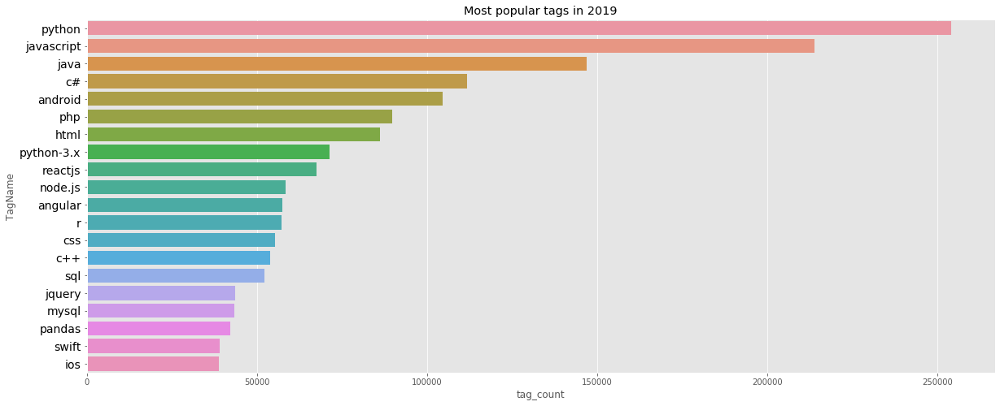

In [10]:
plt.figure(figsize=(20, 8))
plt.title('Most popular tags in 2019')
plt.yticks(fontweight=8, fontsize=14, color='black')
tag_plot = sns.barplot(data=tags.head(20), x='tag_count', y='TagName')
plt.show(tag_plot)

## Weekend vs working days

In [153]:
weekend = pd.read_csv('./data/weekend_working_days.csv')
weekend_filtered = weekend[weekend.total > 1000].sort_values(by=['ratio'], ascending=[False])
weekend_filtered.head(20)

,TagName,total,weekend,ratio
443,discord.js,1643,529,0.321972
489,discord,1461,440,0.301164
491,linked-list,1435,399,0.278049
335,pygame,2237,615,0.274922
231,assembly,3158,859,0.272008
213,haskell,3354,906,0.270125
690,admob,1032,275,0.266473
300,data-structures,2430,639,0.262963
90,algorithm,7733,2018,0.260960
126,firebase-realtime-database,5896,1535,0.260346


### Technologies@Axilis

This section of notebook will explore how technologies used by Axilis developers
TEchnologies that will be explored:
- Go
- Node.js
- React
- Vue
- Kafka
- Cockroach
- Kubernetes

In [28]:
stats = pd.read_csv('data/stats.csv')
stats.sort_values(by=['viewCount'], ascending=[False])

,socreSum,questionCount,viewCount,answerCount,favoriteCount,commentCount,TagName
5,35967,67603,15199275,74011,6784,115841,reactjs
4,21816,58462,9666242,51657,5342,97185,node.js
6,10525,21113,4830737,20555,1830,34388,vue.js
3,6305,9923,2852806,11504,1831,14875,kubernetes
2,440,8216,1403180,8475,1323,18349,go
0,2848,5431,1179012,4502,871,8466,apache-kafka
1,18,53,5569,44,6,85,cockroachdb


In [84]:
import spacy
import re
import string
from collections import Counter, defaultdict
nlp = spacy.load('en_core_web_sm')

from nltk import word_tokenize
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from pprint import pprint

clean_regex = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')
alpha_num_regex = re.compile('^\w+$')

def cleanhtml(raw_html):
    cleantext = re.sub(clean_regex, '', raw_html)
    return cleantext

def get_entitites_for_doc(df):
    entities = []
    for body in df.Body:
        doc = nlp(cleanhtml(body))
        for ent in doc.ents:
            entities.append(ent)
    return entities

def get_entities_for_title(df):
    entities_title = []
    for title in df.Title:
        doc = nlp(cleanhtml(title))
        for ent in doc.ents:
            entities_title.append(ent)
    return entities_title
 
 
def process_text(text, stem=True):
    """ Tokenize text and stem words removing punctuation """
    # text = text.translate(None, string.punctuation)
    text = cleanhtml(text)
    tokens = word_tokenize(text)
    tokens = filter(lambda x: re.match(alpha_num_regex, x), tokens)

    if stem:
        stemmer = WordNetLemmatizer()
        tokens = [stemmer.lemmatize(t) for t in tokens]
 
    return tokens
 
 
def cluster_texts(texts, clusters=3):
    """ Transform texts to Tf-Idf coordinates and cluster texts using K-Means """
    vectorizer = CountVectorizer(tokenizer=process_text,
                                 stop_words=stopwords.words('english'),
                                 lowercase=True)
    print('Text vectorized')
 
    tfidf_model = vectorizer.fit_transform(texts)
    lda = LatentDirichletAllocation(n_components=clusters, max_iter=30, random_state=0)
    # km_model = KMeans(n_clusters=clusters, n_init=20, max_iter=1000)
    lda.fit(tfidf_model)
 
    return vectorizer, lda

def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic #%d:" % topic_idx)
        print(" ".join([feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]))
        print()

### Go

In [13]:
go = pd.read_csv('data/golang.csv')
pd.set_option('display.max_colwidth', 140)
go.head()

,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,"<p>Is there a way in Go to list <em>all</em> the standard/built-in packages (i.e., the packages which come installed with a GoLang insta...",2019-04-23 08:41:20,181,NaN,Can I list all standard Go packages?,<go><go-packages>,8389,3,8.0,6,NaN
1,"<p>It seems that the <code>godoc</code> tool is not <a href=""https://blog.golang.org/modules2019"" rel=""noreferrer"">Go modules</a> aware....",2019-02-28 20:44:35,20,NaN,How to serve documentation using godoc together with go modules?,<go><documentation><documentation-generation><go-modules>,1928,1,2.0,4,NaN
2,<p>I'm unable to run <code>go get git@github&lt;user/repo&gt;</code> in my <code>$GOPATH</code> folder.\nGetting this error:</p>\n\n<blo...,2019-01-29 07:18:47,18,NaN,"Getting GOPATH error ""go: cannot use path@version syntax in GOPATH mode"" in Ubuntu 16.04",<go><gopath>,12046,4,2.0,2,54416455.0
3,<p>I am working with new official mongodb driver for golang. I have created one complex query to insert the data into mongo db and then ...,2019-02-06 07:19:30,17,NaN,Composite literal uses unkeyed fields,<mongodb><go>,10053,2,4.0,3,54548495.0
4,<p>I'm currently using Dep and would like to start using Go modules.</p>\n\n<p>How do I migrate?</p>\n,2019-04-13 10:49:15,17,NaN,How do I migrate from Dep to Go Modules,<go><godeps><go-modules><govendor>,5115,3,4.0,0,55664631.0


In [121]:
title_ent_go = get_entities_for_title(go)
cnt = Counter(list(map(lambda x: x.text, title_ent_go)))

In [122]:
cnt.most_common(40)

[('Golang', 363),
 ('golang', 86),
 ('two', 70),
 ('JSON', 58),
 ('one', 56),
 ('GORM', 39),
 ('SQL', 39),
 ('mongo', 38),
 ('Kubernetes', 35),
 ('first', 31),
 ('2', 29),
 ('HTTP', 28),
 ('1', 25),
 ('Google', 24),
 ('404', 23),
 ('GoLang', 22),
 ('map[string]interface', 22),
 ('Python', 21),
 ('zero', 20),
 ('0', 18),
 ('POST', 18),
 ('GOPATH', 17),
 ('json', 17),
 ('C++', 17),
 ('XML', 16),
 ('Mongo', 15),
 ('EOF', 15),
 ('GCP', 14),
 ('VSCode', 14),
 ('xml', 13),
 ('Kafka', 13),
 ('Docker', 13),
 ('1.11', 12),
 ('Java', 12),
 ('AWS', 12),
 ('TLS', 12),
 ('Gin', 12),
 ('Gorm', 12),
 ('YAML', 11),
 ('Goland', 11)]

In [124]:
go_vect, go_lda = cluster_texts(go.Title, clusters=8)

Text vectorized
/Users/zvonimirilic/Documents/sandbox/virtual-envs/so/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['could', 'doe', 'ha', 'might', 'must', 'need', 'sha', 'wa', 'wo', 'would'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


In [125]:
go_words = go_vect.get_feature_names()
print_top_words(go_lda, go_words, 10)

Topic #0:
go package golang file find module error import code path

Topic #1:
golang server request http go client using connection data query

Topic #2:
go build docker app google golang using cloud use container

Topic #3:
value struct golang type slice interface field map string array

Topic #4:
go function doe variable pas using work parameter call code

Topic #5:
golang mongodb go get file using message driver s3 proxy

Topic #6:
string json go golang convert array different struct using unmarshal

Topic #7:
error channel test go goroutine time memory goroutines return running



### Node.js

In [14]:
node = pd.read_csv('data/nodejs.csv')
node.head(10)

,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,"<p>I have installed node modules by npm install, then I tried to do gulp sass-watch in command prompt. After that I got the below respon...",2019-04-30 12:57:10,227,NaN,How to fix ReferenceError: primordials is not defined in node,<node.js><sass><gulp><gulp-sass>,154830,26,39.0,0,55926692.0
1,"<p>One of my work mate's PRs contains a package-lock.json update, which added <code>""optional"": true</code>:</p>\n\n<pre><code> ""minimis...",2019-01-28 22:45:22,51,NaN,"package-lock.json file, package with ""optional"": true",<node.js><npm>,12740,3,9.0,1,NaN
2,"<p>I am using Mongoose with my Node.js app and this is my configuration: </p>\n\n<pre><code>mongoose.connect(process.env.MONGO_URI, {\n ...",2019-09-11 18:49:39,39,NaN,Server Discovery And Monitoring engine is deprecated,<node.js><mongodb><mongoose><database-connection>,33959,9,7.0,0,57899638.0
3,"<p>I had initially been using electron stable (4.x.x), and was able to use <code>require</code> in both my browser and renderer processe...",2019-03-11 00:10:17,33,NaN,"electron 5.0.0 ""Uncaught ReferenceError: require is not defined""",<javascript><node.js><electron><require>,14159,5,9.0,0,NaN
4,<p>I recently uninstalled and reinstalled Postgres10. I then went to run a Node/Express/React application that relies on connecting to a...,2019-02-10 18:49:42,32,NaN,How to fix 'Unchecked runtime.lastError: Could not establish connection. Receiving end does not exist.',<node.js><linux><postgresql><google-chrome-devtools><sequelize.js>,42728,11,4.0,1,NaN
5,<p>I am running react.js with laravel and watching changes with <code>yarn run watch</code> which has worked fine until I began to come ...,2019-06-17 21:17:31,32,NaN,"How to solve ""TypeError: process.getuid is not a function""",<node.js><reactjs><laravel><npm><webpack>,5711,4,3.0,0,56838008.0
6,<p>Why is it slower to search for a value in an object by key than using <code>for in</code> in JavaScript?</p>\n\n<p>Like this code:</p...,2019-03-14 07:45:11,29,NaN,Why is searching for a value in an object by key slower than using 'for in' in js?,<javascript><node.js>,2131,4,3.0,2,55157360.0
7,"<p>I want to make a image classifier, but I don't know python.\nTensorflow.js works with javascript, which I am familiar with. Can model...",2019-11-20 11:33:41,28,NaN,How to train a model in nodejs (tensorflow.js)?,<javascript><node.js><tensorflow><training-data><tensorflow.js>,1281,4,2.0,9,NaN
8,"<p>I met an error while doing ""brew cleanup"":</p>\n\n<pre><code>$ brew cleanup\nWarning: Skipping opam: most recent version 2.0.3 not in...",2019-02-14 03:39:57,27,NaN,Brew cleanup Error: Permission denied @ unlink_internal,<node.js><macos><homebrew>,14046,2,5.0,0,54683198.0
9,"<p>I've got an ApolloServer project that's giving me trouble, so I thought I might update it and ran into issues when using the latest B...",2019-10-14 21:17:18,25,NaN,SyntaxError: Cannot use import statement outside a module,<javascript><node.js><babeljs><apollo-server>,42487,3,5.0,8,NaN


In [116]:
title_ent_node = get_entities_for_title(node)
node_cnt = Counter(list(map(lambda x: x.text, title_ent_node)))
node_cnt.most_common(40)


[('Node', 1052),
 ('Node.js', 479),
 ('one', 446),
 ('node.js', 432),
 ('two', 388),
 ('Express', 331),
 ('NodeJs', 326),
 ('Heroku', 324),
 ('JSON', 292),
 ('JavaScript', 245),
 ('npm', 236),
 ('Angular', 233),
 ('POST', 214),
 ('NPM', 206),
 ('JS', 205),
 ('SQL', 205),
 ('Nodejs', 191),
 ('2', 190),
 ('404', 189),
 ('first', 179),
 ('Electron', 177),
 ('Javascript', 145),
 ('Google', 124),
 ('mongo', 121),
 ('1', 114),
 ('nodeJS', 113),
 ('EJS', 108),
 ('Node JS', 107),
 ('TypeScript', 107),
 ('AWS', 106),
 ('API', 106),
 ('CORS', 103),
 ('mongoDB', 102),
 ('ERR', 99),
 ('AWS Lambda', 98),
 ('TypeError', 97),
 ('HTTP', 94),
 ('JWT', 92),
 ('Mongo', 92),
 ('second', 91)]

In [126]:
node_vect, node_lda = cluster_texts(node.Title, clusters=8)

node_words = node_vect.get_feature_names()
print_top_words(node_lda, node_words, 10)

Text vectorized
/Users/zvonimirilic/Documents/sandbox/virtual-envs/so/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['could', 'doe', 'ha', 'might', 'must', 'need', 'sha', 'wa', 'wo', 'would'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
Topic #0:
user get data using google page access nodejs way api

Topic #1:
function object array mongoose value return inside async mongodb using

Topic #2:
nodejs doe work process stream angular docker child running issue

Topic #3:
node j npm error module run app command install package

Topic #4:
file nodejs using image string javascript upload json time express

Topic #5:
error query sequelize mysql nodejs database connection table using getting

Topic #6:
mongodb read update property undefined data using type document set

Topic #7:
request server express api nodejs response using send client node


### Comparison of NodeJS and Golang

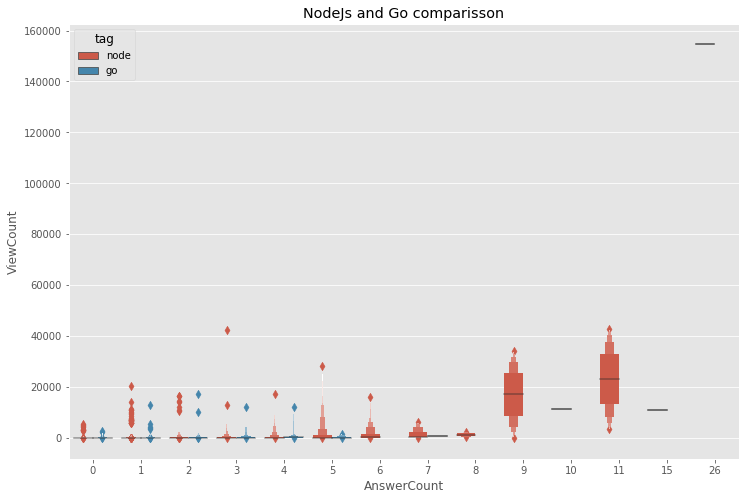

In [15]:
node_counts = node[['AnswerCount', 'FavoriteCount', 'ViewCount']]
node_counts = node_counts.assign(tag='node')
go_counts = go[['AnswerCount', 'FavoriteCount', 'ViewCount']]
go_counts = go_counts.assign(tag='go')

joined = pd.concat([node_counts, go_counts])
plt.figure(figsize=(12, 8))
plt.title('NodeJs and Go comparisson')
plot = sns.boxenplot(data=joined, x='AnswerCount', y='ViewCount', hue='tag')
plt.show(plot)

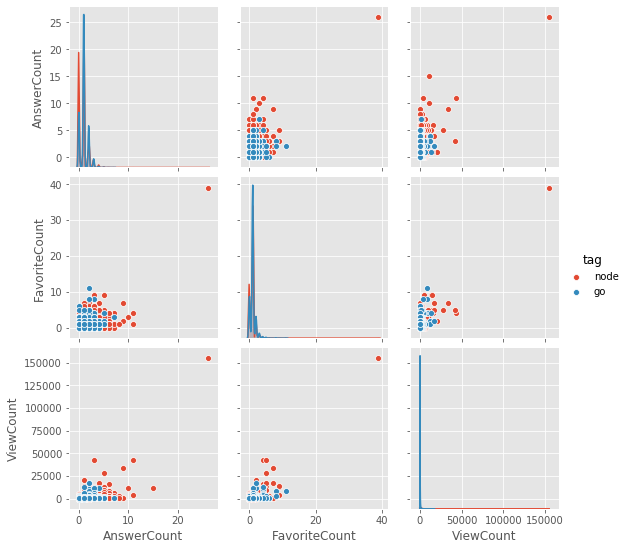

In [16]:
sns.pairplot(joined, hue='tag')
plt.show()

### React vs Vue

In [17]:
react = pd.read_csv('data/reactjs.csv')
vue = pd.read_csv('data/vuejs.csv')

In [29]:
vue_counts = vue[['AnswerCount', 'FavoriteCount', 'ViewCount']]
vue_counts = vue_counts.assign(tag='vue')
react_counts = react[['AnswerCount', 'FavoriteCount', 'ViewCount']]
react_counts = react_counts.assign(tag='react')
joined_fe = pd.concat([vue_counts, react_counts])

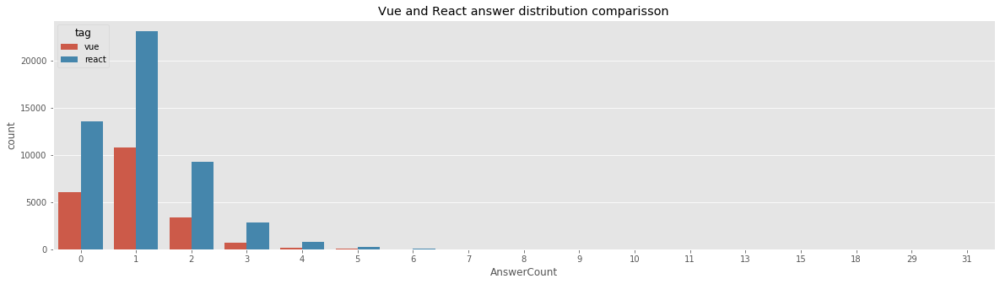

In [95]:
plt.figure(figsize=(20, 5))
plt.title('Vue and React answer distribution comparisson')
vue_react_count_plot = sns.countplot(data=joined_fe, x='AnswerCount', hue='tag')
plt.show(vue_react_count_plot)

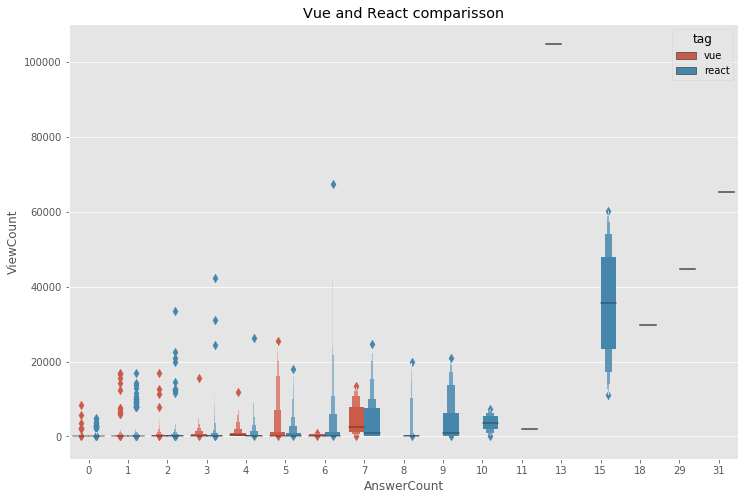

In [64]:
plt.figure(figsize=(12, 8))
plt.title('Vue and React comparisson')
plot = sns.boxenplot(data=joined_fe, x='AnswerCount', y='ViewCount', hue='tag')
plt.show(plot)

Those 5 questions are outliers with 15 answers and unusualy high number of views:

In [90]:
react[react.AnswerCount >= 15]

,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,"<p>When I type the <code>create-react-app my-app</code> command in my terminal, it appears to work - downloading all libraries successfu...",2019-12-05 05:12:26,230,NaN,Template not provided using create-react-app,<reactjs><create-react-app>,44748,29,40.0,3,59189242.0
1,<p><code>react-native run-android</code> command terminates by leaving a message in android simulator. The message is as follows</p>\n\n...,2019-03-31 13:11:07,111,NaN,Unable to load script.Make sure you are either running a Metro server or that your bundle 'index.android.bundle' is packaged correctly f...,<reactjs><react-native><react-native-android><react-native-cli><metro-bundler>,65183,31,27.0,5,NaN
3,<ol>\n<li><p>I just installed node.js &amp; cli</p>\n\n<ul>\n<li>installed node.js</li>\n<li><p>installed react-native-cli</p>\n\n<pre><...,2019-09-26 16:20:03,81,NaN,How to resolve the error on 'react-native start',<reactjs><react-native><react-native-android><react-native-cli><metro-bundler>,60307,15,36.0,1,NaN
4,"<p>I'm trying to use react hooks for a simple problem</p>\n\n<pre><code>const[personState,setPersonState]= useState({DefinedObject});\n...",2019-04-25 10:00:54,71,NaN,"React Hook ""useState"" is called in function ""app"" which is neither a React function component or a custom React Hook function",<reactjs><react-hooks>,29734,18,9.0,4,NaN
211,<p>While staring React app using npm start this error occurred...</p>\n\n<p>I tried below things:</p>\n\n<ol>\n<li><p>remove node_module...,2019-05-09 10:24:05,10,NaN,"How to fix ""TypeError: fsevents is not a constructor"" react error",<javascript><node.js><reactjs>,11066,15,NaN,0,NaN


In [20]:
title_ent_vue = get_entities_for_title(vue)
vue_cnt = Counter(list(map(lambda x: x.text, title_ent_vue)))
vue_cnt.most_common(40)

[('Vue', 783),
 ('VueJS', 359),
 ('Vuetify', 260),
 ('vue.js', 215),
 ('one', 190),
 ('two', 157),
 ('Vue JS', 148),
 ('2', 108),
 ('VUE', 106),
 ('Nuxt', 105),
 ('first', 105),
 ('JS', 95),
 ('404', 80),
 ('JSON', 80),
 ('3', 79),
 ('JavaScript', 73),
 ('CORS', 72),
 ('VueJs', 72),
 ('Vuejs', 71),
 ('Nuxt.js', 65),
 ('vue', 64),
 ('Laravel', 62),
 ('DOM', 62),
 ('Vuex', 52),
 ('Javascript', 51),
 ('Firebase', 46),
 ('API', 46),
 ('TypeScript', 43),
 ('PHP', 37),
 ('second', 37),
 ('1', 33),
 ('Module', 32),
 ('TypeError', 30),
 ('npm', 30),
 ('4', 29),
 ('POST', 29),
 ('Typescript', 28),
 ('Axios', 28),
 ('only one', 27),
 ('Heroku', 26)]

In [21]:
title_ent_react = get_entities_for_title(react)
react_cnt = Counter(list(map(lambda x: x.text, title_ent_react)))
react_cnt.most_common(40)

[('React', 998),
 ('one', 514),
 ('two', 384),
 ('onClick', 281),
 ('first', 243),
 ('ReactJs', 200),
 ('React Native', 195),
 ('JSON', 169),
 ('404', 166),
 ('setState', 161),
 ('TypeError', 158),
 ('JSX', 157),
 ('HOC', 151),
 ('TypeScript', 146),
 ('Gatsby', 142),
 ('2', 141),
 ('Heroku', 133),
 ('API', 126),
 ('Reactjs', 126),
 ('Apollo', 122),
 ('second', 121),
 ('JavaScript', 121),
 ('Typescript', 116),
 ('JS', 116),
 ('DOM', 111),
 ('React Hooks', 110),
 ('Module', 100),
 ('CORS', 96),
 ('Formik', 94),
 ('reactJS', 93),
 ('1', 92),
 ('Enzyme', 87),
 ('Modal', 86),
 ('POST', 83),
 ('Invalid', 71),
 ('React.js', 70),
 ('4', 69),
 ('Javascript', 65),
 ('Array', 64),
 ('Node', 63)]

### Kafka

In [65]:
kafka = pd.read_csv('data/kafka.csv')
kafka.head()

,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,<p>I went to a data engineer job interview. The interviewer asked me a question. He gave me some situation and asked me to design the da...,2019-12-21 10:53:14,21,NaN,Compute the average speed of roads,<apache-spark><apache-kafka><bigdata><stream-processing>,355,5,8.0,3,59501254.0
1,"<p>I am new to Kafka and trying to create a new topic on my local machine.</p>\n\n<p>I am following <a href=""https://kafka.apache.org/qu...",2019-04-03 12:16:42,16,NaN,Why is kafka not creating a topic? bootstrap-server is not a recognized option,<apache-kafka><apache-zookeeper><kafka-topic>,6336,1,5.0,0,55495032.0
2,<p>I am trying to check the kafka consumer by consuming the data from a topic on a remote Kafka cluster. I am getting the following erro...,2019-01-30 15:08:24,14,NaN,Kafka Consumer: No entry found for connection,<apache-kafka><kafka-consumer-api>,11586,6,4.0,0,54479265.0
3,"<p>I'm evaluating AWS Managed Service Kafka (MSK) and I know that currently, it is in preview mode, hence might not have all features or...",2019-03-28 23:09:10,13,NaN,Amazon Managed Streaming for Kafka- MSK features and performance,<amazon-web-services><apache-kafka><aws-msk>,6836,1,6.0,2,55408497.0
4,<p>We have a situation where we need one application to be able to connect to to two versions of kafka(0.7.2 and 0.10.0+) and act as a r...,2019-03-13 19:39:30,11,NaN,Shaded/Repackaged jar as a dependency,<java><maven><apache-kafka><maven-shade-plugin>,365,1,3.0,6,55218729.0


In [154]:
kafka = pd.read_csv('data/kafka.csv')
kafka.head()

,Id,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,59435537,<p>I went to a data engineer job interview. The interviewer asked me a question. He gave me some situation and asked me to design the da...,2019-12-21 10:53:14,21,NaN,Compute the average speed of roads,<apache-spark><apache-kafka><bigdata><stream-processing>,355,5,8.0,3,59501254.0
1,55494988,"<p>I am new to Kafka and trying to create a new topic on my local machine.</p>\n\n<p>I am following <a href=""https://kafka.apache.org/qu...",2019-04-03 12:16:42,16,NaN,Why is kafka not creating a topic? bootstrap-server is not a recognized option,<apache-kafka><apache-zookeeper><kafka-topic>,6336,1,5.0,0,55495032.0
2,54443640,<p>I am trying to check the kafka consumer by consuming the data from a topic on a remote Kafka cluster. I am getting the following erro...,2019-01-30 15:08:24,14,NaN,Kafka Consumer: No entry found for connection,<apache-kafka><kafka-consumer-api>,11586,6,4.0,0,54479265.0
3,55408193,"<p>I'm evaluating AWS Managed Service Kafka (MSK) and I know that currently, it is in preview mode, hence might not have all features or...",2019-03-28 23:09:10,13,NaN,Amazon Managed Streaming for Kafka- MSK features and performance,<amazon-web-services><apache-kafka><aws-msk>,6836,1,6.0,2,55408497.0
4,55150014,<p>We have a situation where we need one application to be able to connect to to two versions of kafka(0.7.2 and 0.10.0+) and act as a r...,2019-03-13 19:39:30,11,NaN,Shaded/Repackaged jar as a dependency,<java><maven><apache-kafka><maven-shade-plugin>,365,1,3.0,6,55218729.0


In [67]:
title_ent_kafka = get_entitites_for_doc(kafka)
kafka_cnt = Counter(list(map(lambda x: x.text, title_ent_kafka)))
kafka_cnt.most_common(40)

[('Kafka', 5190),
 ('1', 2522),
 ('2', 1558),
 ('0', 1422),
 ('String', 1171),
 ('3', 1164),
 ('one', 968),
 ('kafka', 844),
 ('two', 641),
 ('java.util.concurrent', 612),
 ('groupId', 527),
 ('5', 487),
 ('first', 482),
 ('10', 469),
 ('4', 459),
 ('WARN', 378),
 ('NetworkClient', 373),
 ('SSL', 331),
 ('MapString', 269),
 ('100', 268),
 ('1000', 262),
 ('second', 249),
 ('Zookeeper', 243),
 ('ERROR', 242),
 ('_', 241),
 ('Serdes', 238),
 ('Avro', 238),
 ('kafka.coordinator.group', 218),
 ('StringSerializer', 208),
 ('Java', 208),
 ('StringDeserializer', 205),
 ('JSON', 203),
 ('9092', 189),
 ('60000', 187),
 ('HashMap', 186),
 ('6', 183),
 ('KafkaConsumer', 181),
 ('INFO', 178),
 ('30000', 176),
 ('KSQL', 175)]

In [76]:
kafka_vect, kafka_lda = cluster_texts(kafka.Body, clusters=6)
kafka_words = kafka_vect.get_feature_names()
print_top_words(kafka_lda, kafka_words, 10)

Text vectorized
Topic #0:
info 0 1 null partition topic 2 broker consumer log

Topic #1:
error connector info anonfun file connect dependency kafka 1 c

Topic #2:
kafka message consumer topic partition using producer broker error offset

Topic #3:
kafka data message topic spark event streaming v using read

Topic #4:
topic stream value key kafka data schema record table using

Topic #5:
string new public import class type return message private null



Distribution of number of answers for kafka question

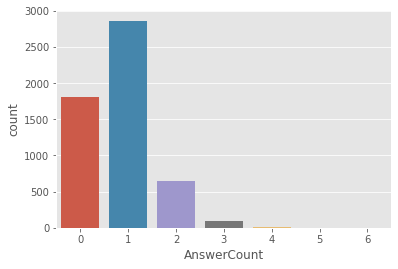

In [151]:
sns.countplot(data=kafka, x='AnswerCount')

### CockroachDB 

In [89]:
ckrc = pd.read_csv('data/cockroach.csv')
ckrc.sort_values(by=['ViewCount'], ascending=[False]).head(10)

,Id,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
15,57662768,"<p>I'm setting up <a href=""https://heroiclabs.com/docs/install-docker-quickstart/"" rel=""nofollow noreferrer"">Nakama</a> for a personal U...",2019-08-26 18:02:53,1,NaN,OCI runtime failed container_linux:345 starting container process caused process_linux init caused rootfs_linux:58 mounting caused perm ...,<docker><unity3d><vps><ubuntu-18.04><cockroachdb>,1043,0,1.0,5,NaN
5,54034183,<p>I have a docker compose file that contains my HAProxy container and 3 Cockroach DB (CKDB) containers. All run with network mode host....,2019-01-04 06:44:29,1,NaN,HAProxy Docker Container is Not able to load balance across my Cockroach DB docker containers using localhost,<docker><docker-compose><haproxy><cockroachdb>,307,1,NaN,2,NaN
30,56430137,<p>I would like to perform upsert sql statement in cockroach DB. </p>\n\n<p>I would like to insert row into table when specific <strong>...,2019-06-03 15:10:52,0,NaN,"column reference xxx is ambiguous (candidates: excluded.xxx,table.xxx) in upsert statement",<knex.js><upsert><cockroachdb>,283,1,NaN,0,56430281.0
4,55047689,<p>I have a bunch of jsonb objects named <strong>text</strong> that all follow the same structure in a table called <strong>texts</stron...,2019-03-07 15:43:19,1,NaN,Sum of differences over a JSONB array field in CockroachDB,<json><cockroachdb>,231,1,NaN,0,55048350.0
6,54171192,"<p>Using VirtualBox and 4 x Centos7 OS installs.</p>\n\n<p>Following a basic Single cluster kubernetes install:</p>\n\n<p><a href=""https...",2019-01-13 17:05:15,1,NaN,CockroachDB on Single Cluster Kube PODs fail with CrashLoopBackOff,<kubernetes><cockroachdb>,201,3,NaN,1,54377835.0
31,56412276,"<p>I am working on migrating a project that used a MySQL DB over to CockroachDB. In this query, I'm simply trying to see if the username...",2019-06-02 04:52:28,0,NaN,SELECT COUNT(*) Thinks String parameter is an IEnumerable - Returns an Array? (CockroachDB C#),<c#><mysql><postgresql><npgsql><cockroachdb>,185,0,1.0,14,NaN
43,55382091,"<p>I have deployed a CockroachDB single instance cluster in my Kubernetes cluster on DO following this link <a href=""https://www.cockroa...",2019-03-27 16:25:27,0,NaN,how to get a client key and client root cert for connecting to CockroachDB from Java client,<kubernetes><csr><cockroachdb>,178,1,NaN,0,55382752.0
40,56086595,"<p>I'm staking to join a CockroachDB node to a cluster.\nI've created first cluster, then try to join 2nd node to the first node, but 2n...",2019-05-11 01:55:41,0,NaN,Can't add node to the cockroachde cluster,<cockroachdb>,177,1,NaN,0,56087554.0
26,57427797,<p>I have a Minikube Kubernetes cluster running a cockroachdb which looks like:</p>\n\n<pre><code>kubectl get pods\n\ntest-cockroachdb-0...,2019-08-09 10:05:08,0,NaN,How do I connect to my local kubernetes CockroachDB with DBeaver?,<kubernetes><minikube><dbeaver><cockroachdb>,166,2,NaN,3,57428781.0
46,55920329,<p>Kubernetes dedicated cockroachdb node - accessing admin ui via traefik ingress controller fails - page isn't redirecting properly</p>...,2019-04-30 11:50:02,0,NaN,How do I make my admin ui of cockroachdb publicly available via traefik ingress controller on kubernetes?,<kubernetes><kubernetes-ingress><cockroachdb>,153,1,NaN,9,NaN


In [86]:
title_ent_ckrc = get_entities_for_title(ckrc)
ckrc_cnt = Counter(list(map(lambda x: x.text, title_ent_ckrc)))
ckrc_cnt.most_common(40)

[('SQLAlchemy', 2),
 ('AJAX', 1),
 ('JSONB', 1),
 ('HAProxy Docker Container', 1),
 ('Cluster Kube', 1),
 ('Kubernetes', 1),
 ('sql', 1),
 ('Cockroachdb', 1),
 ('IP', 1),
 ('Spring-Boot', 1),
 ('Delete oldest n records', 1),
 ('cockroachDb', 1),
 ('Truncate', 1),
 ('Win, Draw & Loss', 1),
 ('column reference xxx', 1),
 ('table.xxx', 1),
 ('Array', 1),
 ('Timezone', 1),
 ('golang', 1),
 ('NewListener', 1),
 ('Entity Framework', 1),
 ('Java', 1),
 ('kubernetes', 1),
 ('Multi Region', 1)]

### Kubernetes

In [120]:
k8 = pd.read_csv('data/k8.csv')
k8.head()

,Id,Body,CreationDate,Score,ParentId,Title,Tags,ViewCount,AnswerCount,FavoriteCount,CommentCount,AcceptedAnswerId
0,55417410,"<p>I'm following that tutorial (<a href=""https://www.baeldung.com/spring-boot-minikube"" rel=""noreferrer"">https://www.baeldung.com/spring...",2019-03-29 12:25:58,61,NaN,Kubernetes create deployment unexpected SchemaError,<kubernetes><kubectl><kubernetes-deployment>,28169,17,10.0,4,55564032.0
1,55373686,"<p>Say, I have two namespaces k8s-app1 and k8s-app2</p>\n\n<p>I can list all pods from specific namespace using the below command</p>\n\...",2019-03-27 09:24:39,35,NaN,How to switch namespace in kubernetes,<kubernetes><namespaces>,27866,6,10.0,1,55373915.0
2,54821044,"<p>I have a MySQL pod running in my cluster.<br> I need to temporarily pause the pod from working without deleting it, something similar...",2019-02-22 06:10:51,31,NaN,how to stop/pause a pod in kubernetes,<docker><kubernetes><kubernetes-pod>,32249,2,4.0,0,54822645.0
3,57970255,<p>I have been trying to install nginx ingress using helm version 3</p>\n\n<pre><code>helm install my-ingress stable/nginx-ingress\n</co...,2019-09-17 08:26:29,27,NaN,Helm V3 - Cannot find the official repo,<kubernetes><kubernetes-helm><kubernetes-deployment>,5723,1,3.0,3,57970816.0
4,57961162,<p>When I try to install a chart with helm:</p>\n\n<pre><code>helm install stable/nginx-ingress --name my-nginx\n</code></pre>\n\n<p>I g...,2019-09-16 16:42:21,26,NaN,Helm install unknown flag --name,<kubernetes><kubernetes-helm>,9884,2,2.0,4,57964140.0


In [121]:
title_ent_k8 = get_entities_for_title(k8)
k8_cnt = Counter(list(map(lambda x: x.text, title_ent_k8)))
k8_cnt.most_common(40)

[('Kubernetes', 1897),
 ('kubernetes', 603),
 ('k8s', 197),
 ('GKE', 178),
 ('Pod', 129),
 ('one', 101),
 ('Helm', 91),
 ('IP', 83),
 ('GCP', 65),
 ('DNS', 59),
 ('EKS', 52),
 ('two', 50),
 ('Docker', 49),
 ('Google', 46),
 ('2', 44),
 ('SSL', 43),
 ('Ingress', 39),
 ('Kubernetes Ingress', 38),
 ('YAML', 34),
 ('TLS', 34),
 ('POD', 34),
 ('AKS', 34),
 ('pod', 33),
 ('404', 33),
 ('Kafka', 32),
 ('NodePort', 31),
 ('PVC', 30),
 ('Kubernetes pod', 30),
 ('Istio', 30),
 ('AWS', 30),
 ('Prometheus', 25),
 ('Kubernetes Pod', 25),
 ('HPA', 24),
 ('HTTP', 24),
 ('Jenkins', 23),
 ('ConfigMap', 23),
 ('IBM', 23),
 ('Google Kubernetes Engine', 23),
 ('3', 22),
 ('Python', 22)]

In [144]:
k8_vect, k8_lda = cluster_texts(k8.Body, clusters=8)
k8_words = k8_vect.get_feature_names()
print_top_words(k8_lda, k8_words, 10)

Text vectorized
/Users/zvonimirilic/Documents/sandbox/virtual-envs/so/lib/python3.7/site-packages/sklearn/feature_extraction/text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['could', 'doe', 'ha', 'might', 'must', 'need', 'sha', 'wa', 'wo', 'would'] not in stop_words.
  'stop_words.' % sorted(inconsistent))
Topic #0:
volume storage false mount persistentvolumeclaim 0 pvc file name persistent

Topic #1:
kubelet node minikube http error failed kubeadm certificate found version

Topic #2:
file kubectl command helm name error get run value user

Topic #3:
pod kubernetes cluster service node using use running one would

Topic #4:
name port metadata spec kind apiversion app service label http

Topic #5:
http info debug host ingres log server certificate connection request

Topic #6:
0 none running pod 1 kubectl status node get ready

Topic #7:
error image docker file failed info 1 run line build



### Geolocations and tags

In [141]:
geo = pd.read_csv('data/geolocations.csv')
geo = geo.dropna()

In [167]:
geo[geo.TagName == 'go'].head(30)

,count,Location,TagName
99,108,India,go
120,95,"Bangalore, Karnataka, India",go
205,59,Germany,go
251,52,Singapore,go
268,49,China,go
300,45,"London, United Kingdom",go
305,45,"Paris, France",go
354,40,"London, UK",go
359,39,Canada,go
373,39,"San Francisco, CA, USA",go
